In [62]:
from GroundingDINO.groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

model = load_model("GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py", "GroundingDINO/weights/groundingdino_swint_ogc.pth")
IMAGE_PATH = "cows.png"
TEXT_PROMPT = "cow."
BOX_TRESHOLD = 0.2
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD,
    device="cpu",
    remove_combined=True
)

print(boxes)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
cv2.imwrite("annotated_olives.jpg", annotated_frame)

final text_encoder_type: bert-base-uncased


tensor([[0.8605, 0.5611, 0.1189, 0.2997],
        [0.6537, 0.5435, 0.1261, 0.2799],
        [0.1941, 0.5937, 0.2784, 0.1695],
        [0.9780, 0.4313, 0.0435, 0.1042],
        [0.9085, 0.4288, 0.1258, 0.1060],
        [0.5380, 0.5783, 0.1074, 0.1312],
        [0.5020, 0.5796, 0.1799, 0.1332],
        [0.2184, 0.4840, 0.1951, 0.1821],
        [0.4662, 0.5265, 0.1740, 0.2765],
        [0.6051, 0.3896, 0.0142, 0.0137],
        [0.2226, 0.5175, 0.2042, 0.2523],
        [0.3770, 0.5374, 0.1265, 0.2787],
        [0.4617, 0.5836, 0.2602, 0.1428],
        [0.3950, 0.5374, 0.1640, 0.2789],
        [0.3379, 0.5272, 0.4344, 0.2973],
        [0.3094, 0.5103, 0.1131, 0.2633],
        [0.5591, 0.3912, 0.0128, 0.0157],
        [0.2420, 0.5107, 0.2425, 0.2647],
        [0.4871, 0.5248, 0.1325, 0.2752],
        [0.4719, 0.5799, 0.2388, 0.1347]])


True

In [54]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

In [55]:
def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [56]:
import os
import sys
current_dir = os.getcwd()

# Add the parent directory of 'samsam' to the system path
sys.path.append(os.path.abspath(os.path.join(current_dir, './samsam/')))

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
import numpy as np
import torch
import cv2
from PIL import Image
import matplotlib.pyplot as plt

from hydra import initialize_config_module
from hydra.core.global_hydra import GlobalHydra

if not GlobalHydra.instance().is_initialized():
    initialize_config_module("samsam/sam2", version_base="1.2")


NameError: name 'w' is not defined

In [ ]:
boxes

In [57]:

# Load SAM2 model
sam2_checkpoint = "C:/Users/Usuario/Documents/Projectes/LauzHack2024/LauzHack2024/samsam/weights/sam2.1_hiera_tiny.pt"
model_cfg = "C:/Users/Usuario/Documents/Projectes/LauzHack2024/LauzHack2024/samsam/sam2/configs/sam2.1/sam2.1_hiera_t.yaml"
device = "cuda" if torch.cuda.is_available() else "cpu"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)
predictor = SAM2ImagePredictor(sam2_model)


In [ ]:
show_box()

In [66]:

# Load image
image_path = "cows.png"  # Replace with your image
image = Image.open(image_path).convert("RGB")
image = np.array(image)
height, width = image.shape[:2]

from torchvision.ops import box_convert
boxes2 = boxes * torch.Tensor([width, height, width, height])
xyxy = box_convert(boxes=boxes2, in_fmt="cxcywh", out_fmt="xyxy").numpy()


In [50]:
xyxy


array([[ 616.8514   ,  183.35922  , 1226.8694   ,  717.23816  ],
       [   4.4019775,  180.78745  ,  468.85516  ,  717.603    ],
       [1072.1289   ,  466.52905  , 1278.4346   ,  703.5028   ],
       [ 757.10895  ,  471.2561   ,  796.0817   ,  511.6974   ],
       [ 581.9596   ,  462.49957  ,  734.692    ,  671.80023  ],
       [ 722.74115  ,  459.82736  ,  769.31647  ,  525.89984  ],
       [ 549.8627   ,  518.2727   ,  632.8104   ,  641.978    ]],
      dtype=float32)

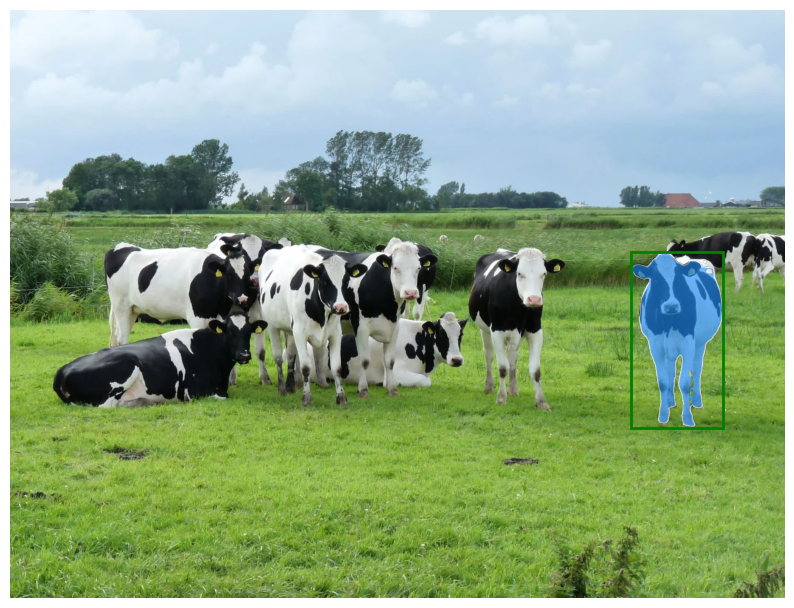

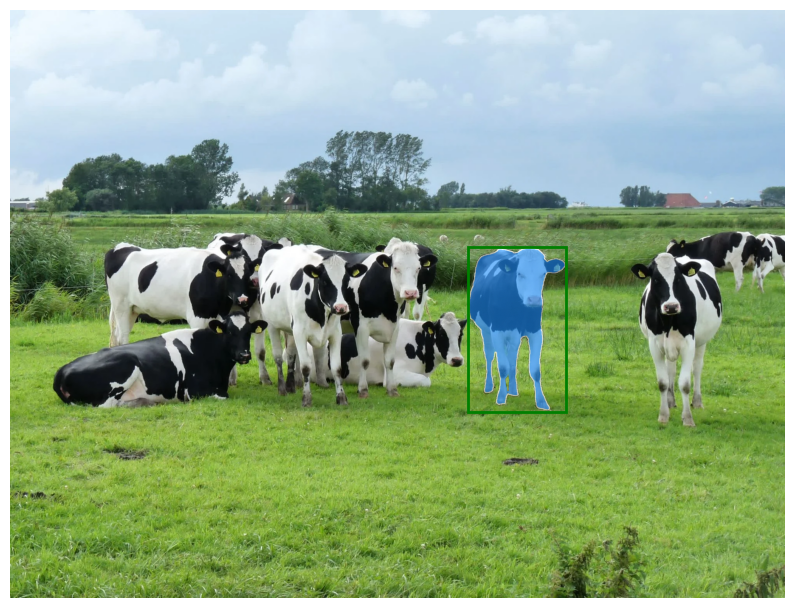

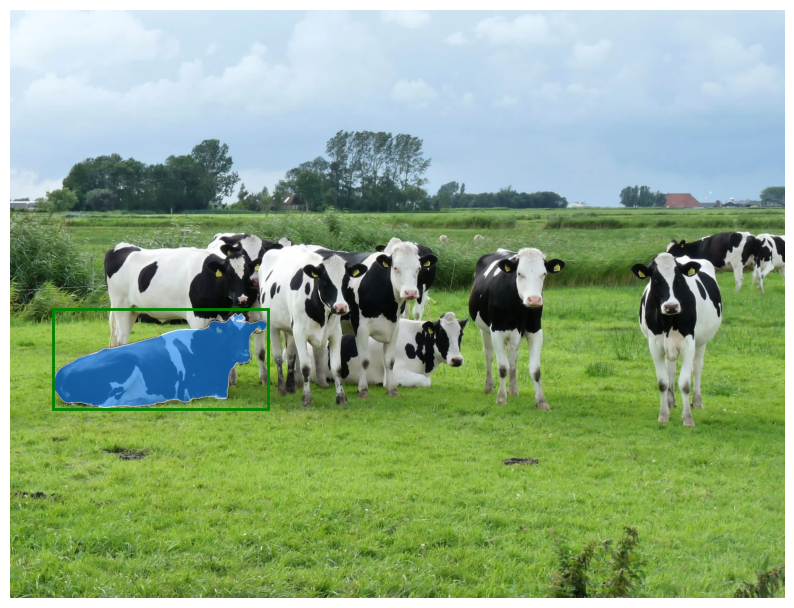

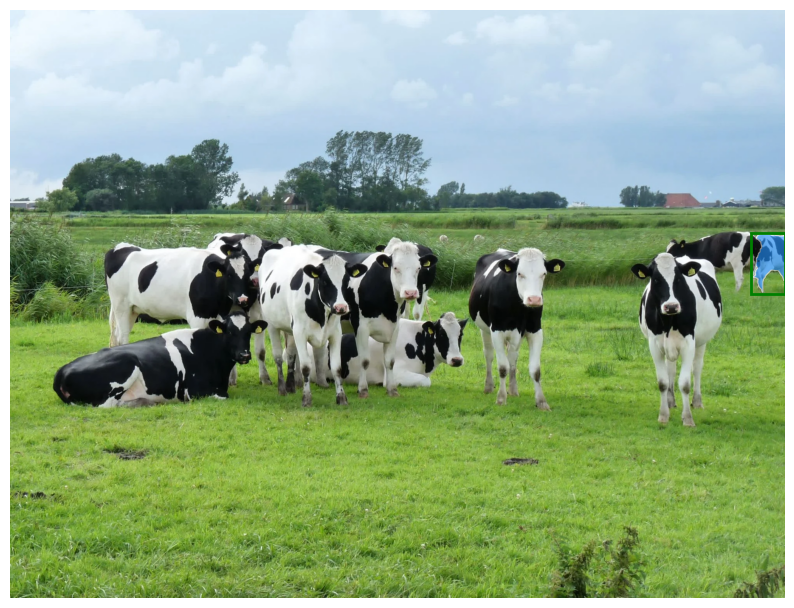

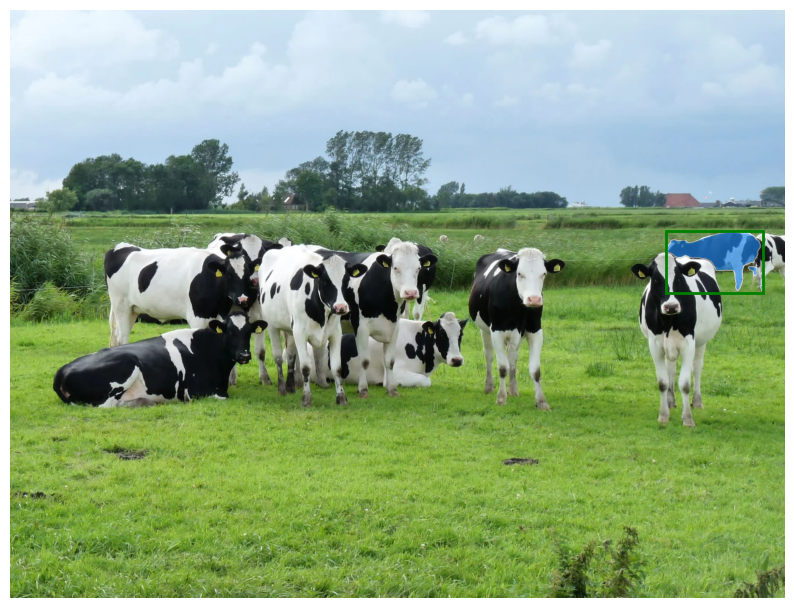

...

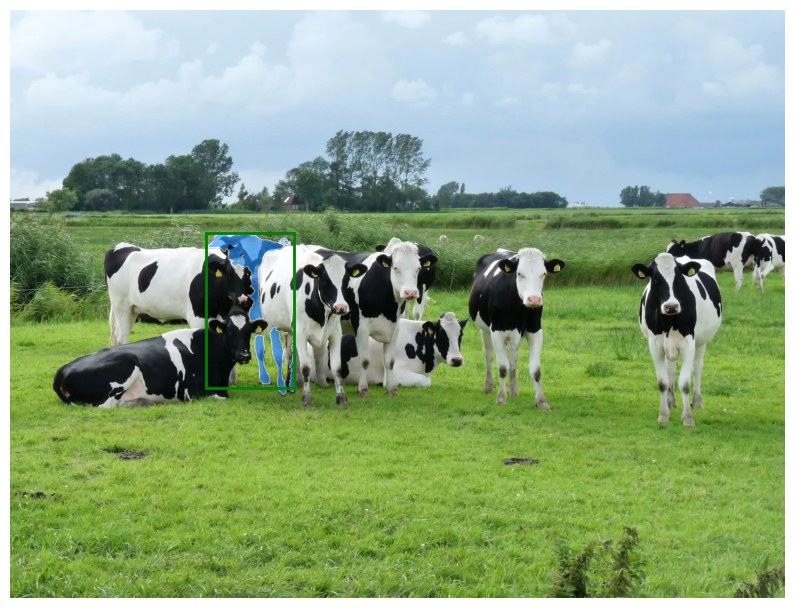

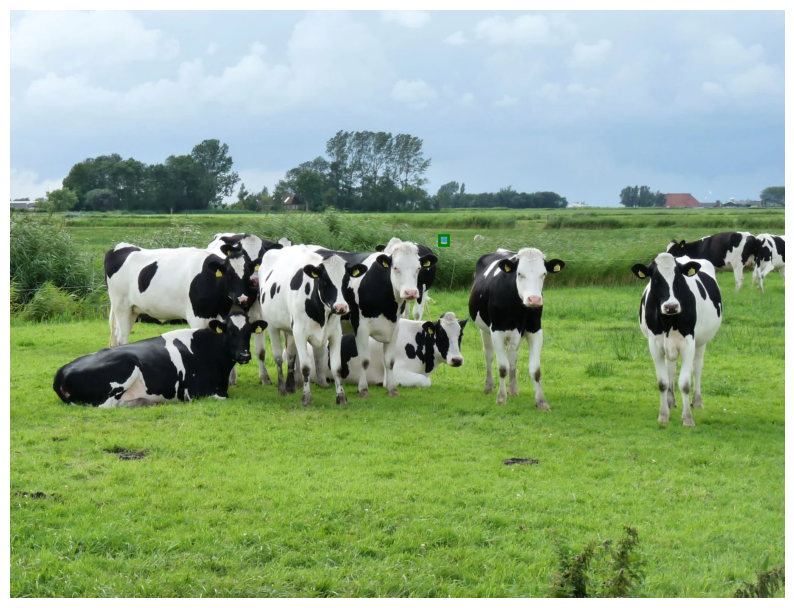

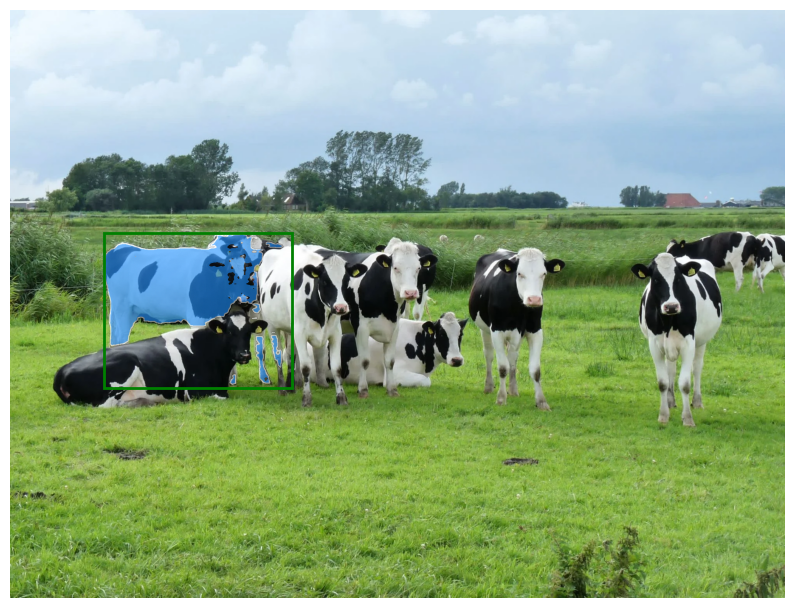

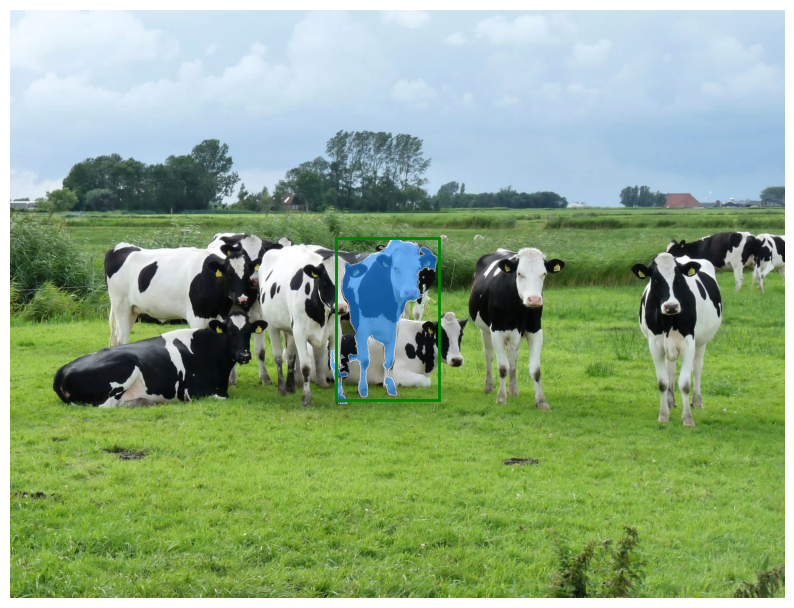

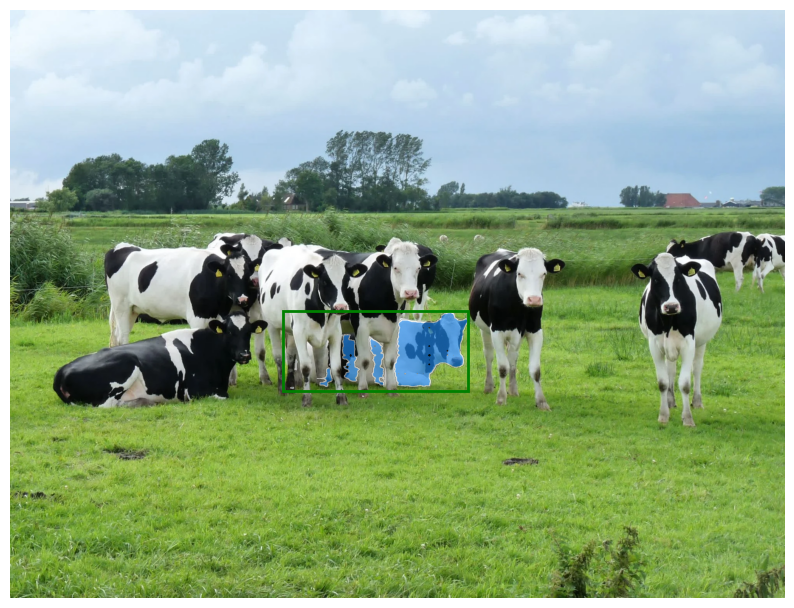

In [ ]:

# Process image for SAM2
predictor.set_image(image)
for box in xyxy:
    x_min, y_min, x_max, y_max = box

    input_box = np.array([x_min, y_min, x_max, y_max])

    # Predict masks for each bounding box
    masks, scores, logits = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False,  # Generate multiple masks
    )

    # Sort masks by scores
    sorted_ind = np.argsort(scores)[::-1]
    masks = masks[sorted_ind]
    
    scores = scores[sorted_ind]

    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=True)
        show_box(box, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()
